In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
import tensorflow as tf
import datetime

# Original Food101 paper: https://data.vision.ee.ethz.ch/cvl/datasets_extra/food-101/static/bossard_eccv14_food-101.pdf
# Base line to beat 50.76% accuracy over 101 classes of food

# variabels
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
EPOCHS = 5
INPUT_SHAPE = (224, 224, 3)

# Initiating datasets
# start small and go all in
train_dir = "/kaggle/input/custom/101_food_classes_10_percent/train"
test_dir = "/kaggle/input/custom/101_food_classes_10_percent/test"

# Create train and test data generators
train_data_10_percent = tf.keras.preprocessing.image_dataset_from_directory(directory=train_dir,
                                                                            image_size=IMG_SIZE,
                                                                            label_mode="categorical",
                                                                            batch_size=BATCH_SIZE)
test_data = tf.keras.preprocessing.image_dataset_from_directory(directory=test_dir,
                                                                image_size=IMG_SIZE,
                                                                label_mode="categorical",
                                                                batch_size=BATCH_SIZE,
                                                                shuffle=False) # keep test data in order to evaluate later
 
# Helper functions
# Plot loss curves
def plot_loss_curves(history):
    loss = history.history["loss"]
    val_loss = history.history["val_loss"]
    accuracy = history.history["accuracy"]
    val_accuracy = history.history["val_accuracy"]
    epochs = range(len(history.history["loss"]))

    plt.plot(epochs, loss, label="loss_curve")
    plt.plot(epochs, val_loss, label="val_loss_curve")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    plt.figure()

    plt.plot(epochs, accuracy, label="accuracy_curve")
    plt.plot(epochs, val_accuracy, label="val_accuracy_curve")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()
    
    plt.show()

# Create basic model   
def create_basic_model():
    inputs = tf.keras.layers.Input(shape=INPUT_SHAPE)
    basic_model = tf.keras.applications.EfficientNetB0(include_top=False)
    basic_model.trainable = False
    x = basic_model(inputs)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dense(len(train_data_10_percent.class_names), activation="softmax")(x)
    output = tf.keras.layers.Dense(len(train_data_10_percent.class_names), activation="softmax")(x)
    model = tf.keras.Model(inputs,output)
    return model

# Create tensorboard callback
def create_tensorboard_callback(dir_name, experiment_name):
    log_dir = dir_name + "/" + experiment_name +"/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir)
    return tensorboard_callback

# Compare history
def compare_historys(original_history, new_history, initial_epochs=5):
    acc = original_history.history["accuracy"]
    loss = original_history.history["loss"]
    val_acc = original_history.history["val_accuracy"]
    val_loss = original_history.history["val_loss"]
    
    total_acc = acc + new_history.history["accuracy"]
    total_loss = loss + new_history.history["loss"]
    total_val_acc = val_acc + new_history.history["val_accuracy"]
    total_val_loss = val_loss + new_history.history["val_loss"]

    plt.figure(figsize=(8,8))
    plt.subplot(2,1,1)
    plt.plot(total_acc, label="Training Accuracy")
    plt.plot(total_val_acc, label="Validation Accuracy")
    plt.plot([initial_epochs-1, initial_epochs-1],
             plt.ylim(), label="start fine tuning")
    plt.legend()
    plt.title("Training and Validation Accuracy")

    plt.subplot(2,1,2)
    plt.plot(total_loss, label="Training Loss")
    plt.plot(total_val_loss, label="Validation Loss")
    plt.plot([initial_epochs-1, initial_epochs-1],
              plt.ylim(), label='Start Fine Tuning')
    plt.title("Training and Validation Loss")
    plt.legend()
    plt.xlabel("Epochs")
    plt.show()

# Walk through dir
# 101 classes, 75 images in each class, 7575 images total -> train
# 101 classes, 250 images in each class, 25250 images total -> test
def walk_through_dir(dir_path):
    for dirpath, dirnames, filenames in os.walk(dir_path):
        print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")


# Model checkpoint callback
def create_model_checkpoint(model_name, dir_name):
    checkpoint_path = dir_name + "/" + model_name + ".ckpt"
    model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                          monitor="val_accuracy",
                                                          save_best_only=True,
                                                          save_weights_only=True,
                                                          verbose=0)
    return model_checkpoint

# Data augmentation
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.experimental.preprocessing.RandomFlip("horizontal"),
    tf.keras.layers.experimental.preprocessing.RandomRotation(0.2),
    tf.keras.layers.experimental.preprocessing.RandomZoom(0.2),
    tf.keras.layers.experimental.preprocessing.RandomWidth(0.2),
    tf.keras.layers.experimental.preprocessing.RandomHeight(0.2)
], name="data_augmentation")

# Create a base model
def create_base_model():
    base_model = tf.keras.applications.EfficientNetB0(include_top=False)
    base_model.trainable = False
    inputs = tf.keras.layers.Input(shape=INPUT_SHAPE, name="input_layer")
    x = data_augmentation(inputs)
    x = base_model(x, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
    outputs = tf.keras.layers.Dense(len(train_data_10_percent.class_names), activation="softmax", name="output_layer")(x)
    model = tf.keras.Model(inputs, outputs)
    return model

# Compile model
def compile_model(model,learning_rate=0.001):
    model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  metrics=["accuracy"])
    return model

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

Found 7575 files belonging to 101 classes.
Found 25250 files belonging to 101 classes.


In [2]:
model = create_base_model()
model.summary()

16705208/16705208 [==============================] - 0s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, None, None, 3)    0         
 al)                                                             
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_avg_pool_layer (Glob  (None, 1280)             0         
 alAveragePooling2D)                                             
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                              

In [3]:
compile_model(model)
history_all_classes_10_percent = model.fit(train_data_10_percent,
                                            epochs=EPOCHS,
                                            steps_per_epoch=len(train_data_10_percent),
                                            validation_data=test_data,
                                            validation_steps=int(0.15*len(test_data)),
                                            callbacks=[create_model_checkpoint(model_name="efficientnetb0_feature_extract_model",dir_name="model_checkpoints")])

Epoch 1/5
237/237 [==============================] - 126s 468ms/step - loss: 3.3781 - accuracy: 0.2708 - val_loss: 2.5390 - val_accuracy: 0.4447
Epoch 2/5
237/237 [==============================] - 73s 306ms/step - loss: 2.2093 - accuracy: 0.4941 - val_loss: 2.0709 - val_accuracy: 0.5103
Epoch 3/5
237/237 [==============================] - 66s 278ms/step - loss: 1.8237 - accuracy: 0.5650 - val_loss: 1.8965 - val_accuracy: 0.5363
Epoch 4/5
237/237 [==============================] - 66s 272ms/step - loss: 1.6038 - accuracy: 0.6137 - val_loss: 1.8075 - val_accuracy: 0.5432
Epoch 5/5
237/237 [==============================] - 58s 241ms/step - loss: 1.4553 - accuracy: 0.6492 - val_loss: 1.7650 - val_accuracy: 0.5450


In [4]:
feature_extraction_results = model.evaluate(test_data)

790/790 [==============================] - 99s 125ms/step - loss: 1.5780 - accuracy: 0.5851


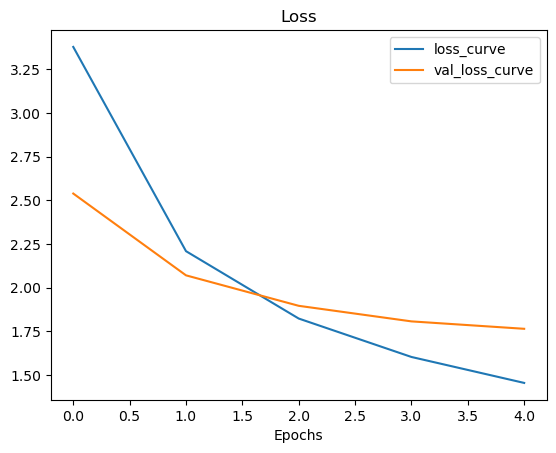

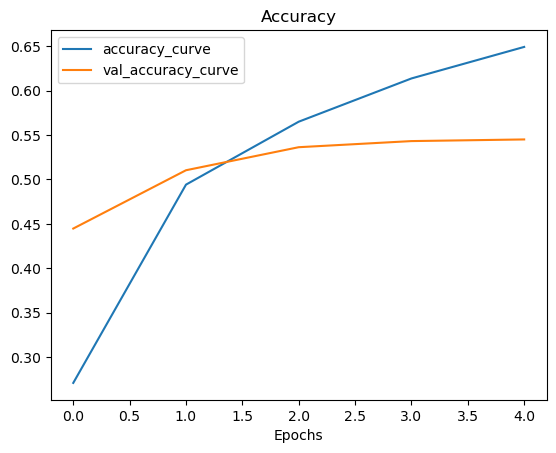

In [5]:
plot_loss_curves(history_all_classes_10_percent)

In [6]:
base_model = tf.keras.applications.EfficientNetB0(include_top=False)
base_model.trainable = True
inputs = tf.keras.layers.Input(shape=INPUT_SHAPE, name="input_layer")
x = data_augmentation(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = tf.keras.layers.Dense(len(train_data_10_percent.class_names), activation="softmax", name="output_layer")(x)
model = tf.keras.Model(inputs, outputs)
for layer in base_model.layers[:-5]: # freeze all layers except last 5
    layer.trainable = False

In [7]:
model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(1e-04),
                  metrics=["accuracy"])

In [8]:
for layer in model.layers:
    print(layer.name, layer.trainable)

input_layer True
data_augmentation True
efficientnetb0 True
global_avg_pool_layer True
output_layer True


In [9]:
for layer_number, layer in enumerate(base_model.layers):
    print(layer_number, layer.name, layer.trainable)

0 input_2 False
1 rescaling_2 False
2 normalization_1 False
3 rescaling_3 False
4 stem_conv_pad False
5 stem_conv False
6 stem_bn False
7 stem_activation False
8 block1a_dwconv False
9 block1a_bn False
10 block1a_activation False
11 block1a_se_squeeze False
12 block1a_se_reshape False
13 block1a_se_reduce False
14 block1a_se_expand False
15 block1a_se_excite False
16 block1a_project_conv False
17 block1a_project_bn False
18 block2a_expand_conv False
19 block2a_expand_bn False
20 block2a_expand_activation False
21 block2a_dwconv_pad False
22 block2a_dwconv False
23 block2a_bn False
24 block2a_activation False
25 block2a_se_squeeze False
26 block2a_se_reshape False
27 block2a_se_reduce False
28 block2a_se_expand False
29 block2a_se_excite False
30 block2a_project_conv False
31 block2a_project_bn False
32 block2b_expand_conv False
33 block2b_expand_bn False
34 block2b_expand_activation False
35 block2b_dwconv False
36 block2b_bn False
37 block2b_activation False
38 block2b_se_squeeze Fals

In [10]:
fine_tune_epochs = EPOCHS + 5
history_fine_tune_model = model.fit(train_data_10_percent,
                                    epochs=fine_tune_epochs,
                                    steps_per_epoch=len(train_data_10_percent),
                                    validation_data=test_data,
                                    validation_steps=int(0.15*len(test_data)),
                                    initial_epoch=history_all_classes_10_percent.epoch[-1],) # start training from previous last epoch)

Epoch 5/10
237/237 [==============================] - 67s 236ms/step - loss: 4.0623 - accuracy: 0.1343 - val_loss: 3.3480 - val_accuracy: 0.2513
Epoch 6/10
237/237 [==============================] - 52s 215ms/step - loss: 2.6369 - accuracy: 0.3658 - val_loss: 2.5508 - val_accuracy: 0.3919
Epoch 7/10
237/237 [==============================] - 60s 250ms/step - loss: 2.1401 - accuracy: 0.4598 - val_loss: 2.2713 - val_accuracy: 0.4261
Epoch 8/10
237/237 [==============================] - 47s 197ms/step - loss: 1.8961 - accuracy: 0.5182 - val_loss: 2.1921 - val_accuracy: 0.4454
Epoch 9/10
237/237 [==============================] - 46s 192ms/step - loss: 1.7497 - accuracy: 0.5460 - val_loss: 2.0529 - val_accuracy: 0.4746
Epoch 10/10
237/237 [==============================] - 46s 190ms/step - loss: 1.6336 - accuracy: 0.5750 - val_loss: 2.0444 - val_accuracy: 0.4703


In [11]:
all_classes_10_percent_fine_tune_results = model.evaluate(test_data)

790/790 [==============================] - 64s 81ms/step - loss: 1.6827 - accuracy: 0.5490


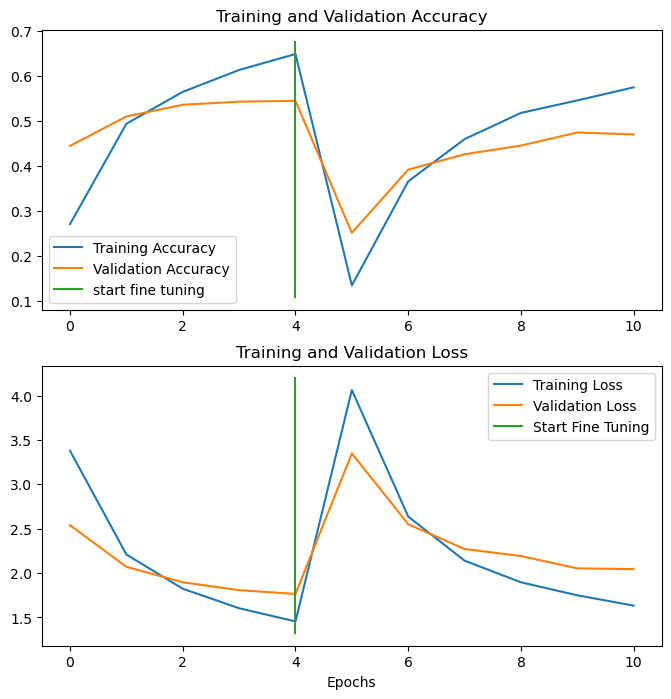

In [12]:
compare_historys(original_history=history_all_classes_10_percent,
                    new_history=history_fine_tune_model,
                    initial_epochs=5)

In [13]:
all_classes_10_percent_fine_tune_results

[1.6827404499053955, 0.5489504933357239]

In [14]:
# Download pre-trained model from Google Storage (like a cooking show, I trained this model earlier, so the results may be different than above)
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
saved_model_path = "06_101_food_class_10_percent_saved_big_dog_model.zip"

--2023-09-10 00:32:57--  https://storage.googleapis.com/ztm_tf_course/food_vision/06_101_food_class_10_percent_saved_big_dog_model.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 209.85.146.207, 142.250.125.207, 142.250.148.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|209.85.146.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 46760742 (45M) [application/zip]
Saving to: ‘06_101_food_class_10_percent_saved_big_dog_model.zip’

06_101_food_class_1 100%[===================>]  44.59M   119MB/s    in 0.4s    

2023-09-10 00:32:57 (119 MB/s) - ‘06_101_food_class_10_percent_saved_big_dog_model.zip’ saved [46760742/46760742]



In [15]:
import zipfile
def unzip_data(filename):
    zip_ref = zipfile.ZipFile(filename, "r")
    zip_ref.extractall()
    zip_ref.close()

In [16]:
unzip_data("/kaggle/working/06_101_food_class_10_percent_saved_big_dog_model.zip")

In [17]:
pre_trained_model = tf.keras.models.load_model("/kaggle/working/06_101_food_class_10_percent_saved_big_dog_model")

In [18]:
pre_trained_model.summary()

Model: "functional_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential_4 (Sequential)   (None, None, None, 3)     0         
                                                                 
 efficientnetb0 (Functional)  (None, None, None, 1280)  4049571  
                                                                 
 global_average_pooling2d_9   (None, 1280)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_8 (Dense)             (None, 101)               129381    
                                                                 
Total params: 4,178,952
Trainable params: 4,136,929
Non-trainable params: 42,023
______________________________________

In [19]:
result_downloaded_model = pre_trained_model.evaluate(test_data)

790/790 [==============================] - 74s 92ms/step - loss: 1.8027 - accuracy: 0.6078


In [20]:
preds_prods = model.predict(test_data, verbose=1)

790/790 [==============================] - 75s 92ms/step


In [21]:
preds_prods.shape, preds_prods[0].shape, preds_prods[0].argmax(), test_data.class_names[28]

((25250, 101), (101,), 2, 'croque_madame')

In [22]:
preds_labels = []
for pred in preds_prods:
    preds_labels.append(test_data.class_names[tf.argmax(pred)])

In [23]:
preds_labels[:10]

['baklava',
 'apple_pie',
 'carrot_cake',
 'fish_and_chips',
 'bread_pudding',
 'poutine',
 'cup_cakes',
 'macaroni_and_cheese',
 'omelette',
 'apple_pie']

In [24]:
test_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [25]:
y_labels = []
for images, labels in test_data.unbatch():
    y_labels.append(labels.numpy().argmax())

In [26]:
len(y_labels)

25250

In [27]:
# Pretrainded model evaluaion on test_data
result_downloaded_model

[1.8027206659317017, 0.6077623963356018]

In [28]:
pred_classes = preds_prods.argmax(axis=1)

In [29]:
from sklearn.metrics import accuracy_score
sklearn_accuracy = accuracy_score(y_true=y_labels, y_pred=pred_classes)
sklearn_accuracy

0.548950495049505

In [30]:
from sklearn.metrics import confusion_matrix
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False): 
    # Create the confustion matrix
    cm = confusion_matrix(y_true=y_true, y_pred=y_pred, normalize=norm)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize our confusion matrix
    n_classes = cm.shape[0] # find the number of classes we're dealing with
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.Blues) # create a matrix plot using seaborn heatmap
    fig.colorbar(cax) # create a colorbar
    if classes:
        labels = classes
    else:
        labels = np.arange(cm.shape[0])
    ax.set(title="Confusion Matrix",
           xlabel="Predicted label",
           ylabel="True label",
           xticks=np.arange(n_classes),
           yticks=np.arange(n_classes),
           xticklabels=labels,
           yticklabels=labels)
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()    
    plt.xticks(rotation=90)
    threshold=(cm.max() + cm.min()) / 2

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                    horizontalalignment="center",
                    color="white" if cm[i, j] > threshold else "black",
                    size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
                    horizontalalignment="center",
                    color="white" if cm[i, j] > threshold else "black",
                    size=text_size)

    # Save the figure to the current working directory
    if savefig:
        fig.savefig("confusion_matrix.png")

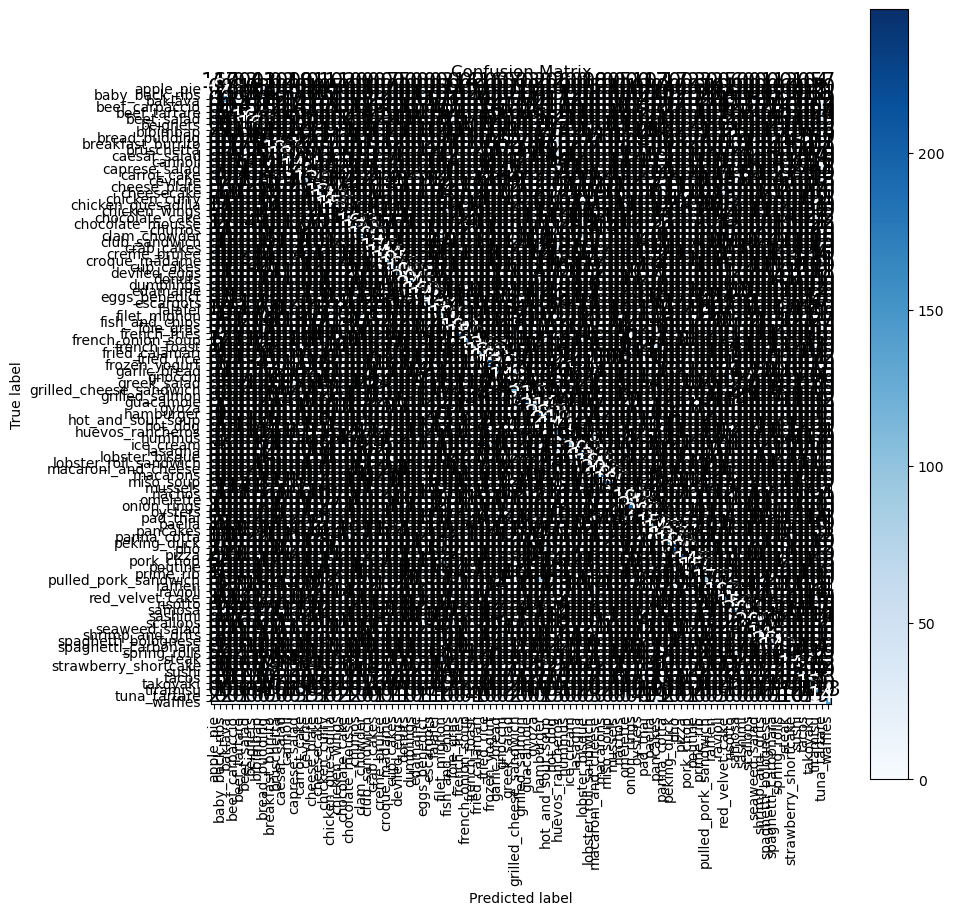

In [31]:
class_names=test_data.class_names
import itertools
make_confusion_matrix(y_true=y_labels,y_pred=pred_classes,classes=class_names, norm=None)

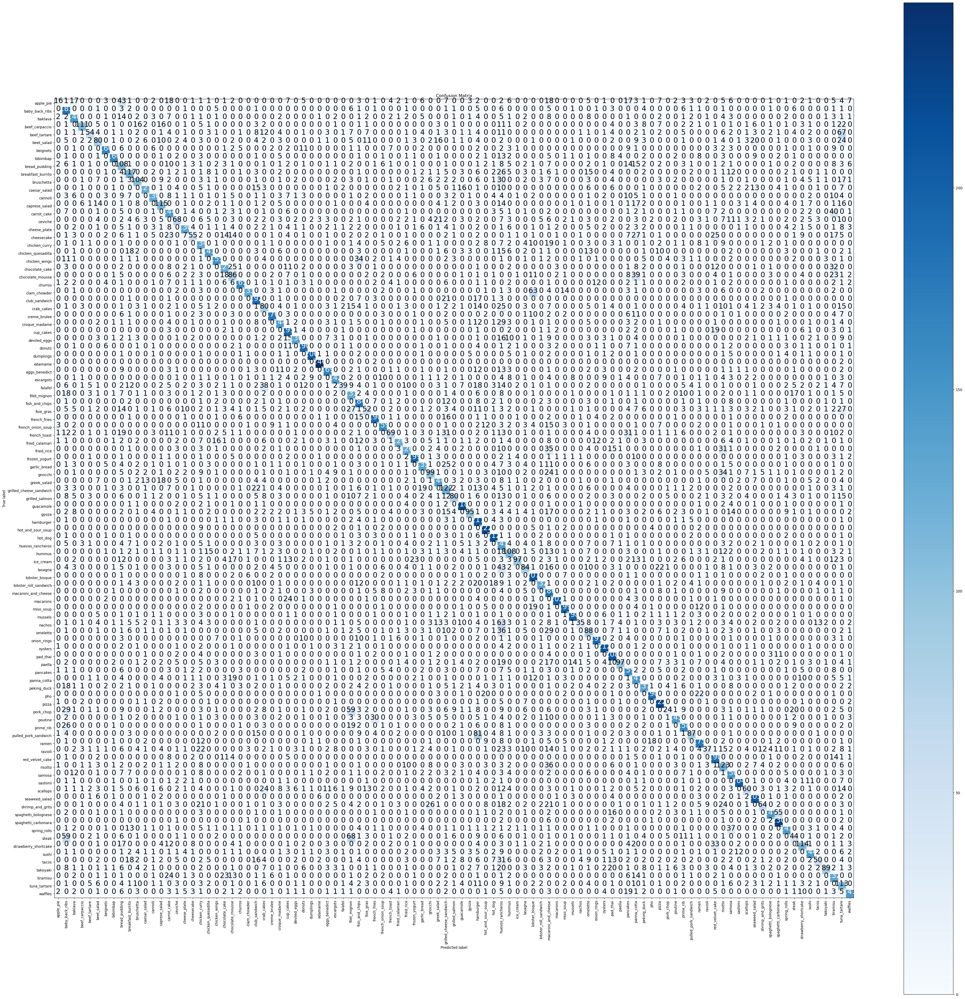

In [32]:
make_confusion_matrix(y_true=y_labels,y_pred=pred_classes,classes=class_names, norm=None, figsize=(50,50), text_size=20)

In [33]:
make_confusion_matrix(y_true=y_labels,y_pred=pred_classes,classes=class_names, norm=None, figsize=(100,100), text_size=20)

In [34]:
from sklearn.metrics import classification_report
print(classification_report(y_true=y_labels, y_pred=pred_classes))
# Our model predicts very good on some classes and bad on other classes

              precision    recall  f1-score   support

           0       0.48      0.06      0.11       250
           1       0.40      0.73      0.52       250
           2       0.60      0.58      0.59       250
           3       0.78      0.44      0.57       250
           4       0.61      0.22      0.32       250
           5       0.45      0.32      0.38       250
           6       0.82      0.66      0.73       250
           7       0.89      0.66      0.76       250
           8       0.26      0.43      0.32       250
           9       0.47      0.47      0.47       250
          10       0.48      0.42      0.45       250
          11       0.73      0.51      0.60       250
          12       0.73      0.52      0.61       250
          13       0.53      0.46      0.49       250
          14       0.40      0.58      0.47       250
          15       0.48      0.27      0.35       250
          16       0.66      0.52      0.58       250
          17       0.53    

In [35]:
classification_report_dict =  classification_report(y_true=y_labels, y_pred=pred_classes, output_dict=True)

<Axes: title={'center': 'Classification report'}>

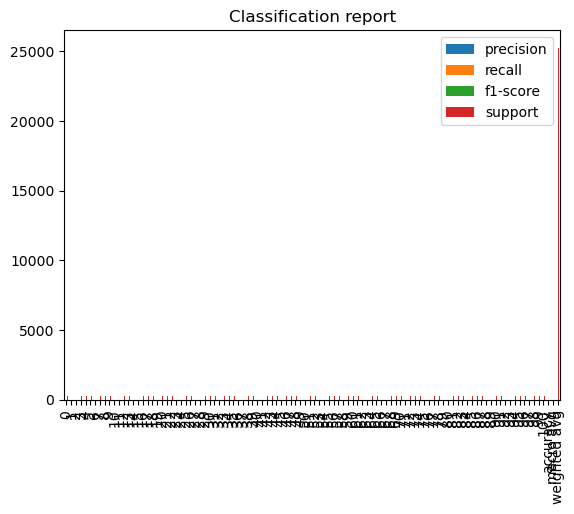

In [36]:
pd.DataFrame(classification_report_dict).T.plot.bar(title="Classification report")

In [37]:
classification_report_dict

{'0': {'precision': 0.48484848484848486,
  'recall': 0.064,
  'f1-score': 0.11307420494699646,
  'support': 250},
 '1': {'precision': 0.40043763676148797,
  'recall': 0.732,
  'f1-score': 0.5176803394625177,
  'support': 250},
 '2': {'precision': 0.5959183673469388,
  'recall': 0.584,
  'f1-score': 0.5898989898989899,
  'support': 250},
 '3': {'precision': 0.7816901408450704,
  'recall': 0.444,
  'f1-score': 0.5663265306122449,
  'support': 250},
 '4': {'precision': 0.6136363636363636,
  'recall': 0.216,
  'f1-score': 0.31952662721893493,
  'support': 250},
 '5': {'precision': 0.45454545454545453,
  'recall': 0.32,
  'f1-score': 0.3755868544600939,
  'support': 250},
 '6': {'precision': 0.8177339901477833,
  'recall': 0.664,
  'f1-score': 0.7328918322295805,
  'support': 250},
 '7': {'precision': 0.8877005347593583,
  'recall': 0.664,
  'f1-score': 0.7597254004576658,
  'support': 250},
 '8': {'precision': 0.2553191489361702,
  'recall': 0.432,
  'f1-score': 0.32095096582466565,
  'sup

In [38]:
class_f1_scores = {}
for k,v in classification_report_dict.items():
    if k == "accuracy":
        break
    else:
        class_f1_scores[class_names[int(k)]] = v["f1-score"]

In [39]:
class_f1_scores

{'apple_pie': 0.11307420494699646,
 'baby_back_ribs': 0.5176803394625177,
 'baklava': 0.5898989898989899,
 'beef_carpaccio': 0.5663265306122449,
 'beef_tartare': 0.31952662721893493,
 'beet_salad': 0.3755868544600939,
 'beignets': 0.7328918322295805,
 'bibimbap': 0.7597254004576658,
 'bread_pudding': 0.32095096582466565,
 'breakfast_burrito': 0.46987951807228917,
 'bruschetta': 0.4463519313304721,
 'caesar_salad': 0.5976470588235294,
 'cannoli': 0.6074766355140186,
 'caprese_salad': 0.49040511727078895,
 'carrot_cake': 0.4744645799011532,
 'ceviche': 0.346938775510204,
 'cheese_plate': 0.5803571428571429,
 'cheesecake': 0.311614730878187,
 'chicken_curry': 0.4180967238689548,
 'chicken_quesadilla': 0.6271929824561403,
 'chicken_wings': 0.6540084388185654,
 'chocolate_cake': 0.5204918032786886,
 'chocolate_mousse': 0.34747474747474744,
 'churros': 0.7300884955752213,
 'clam_chowder': 0.6616915422885572,
 'club_sandwich': 0.6144000000000001,
 'crab_cakes': 0.3225806451612903,
 'creme_bru

In [40]:
import operator
sorted_class_f1_scores = sorted(class_f1_scores.items(), key=operator.itemgetter(1), reverse=True)
sorted_class_f1_scores

[('edamame', 0.9553398058252428),
 ('macarons', 0.8559322033898304),
 ('dumplings', 0.8512396694214877),
 ('sashimi', 0.8429752066115703),
 ('oysters', 0.8138195777351247),
 ('pho', 0.8119658119658119),
 ('mussels', 0.8065173116089613),
 ('onion_rings', 0.7974947807933194),
 ('miso_soup', 0.796),
 ('hot_and_sour_soup', 0.7942754919499105),
 ('frozen_yogurt', 0.7912524850894632),
 ('hot_dog', 0.7851851851851852),
 ('spaghetti_carbonara', 0.7718120805369127),
 ('guacamole', 0.7716814159292035),
 ('bibimbap', 0.7597254004576658),
 ('creme_brulee', 0.7473460721868364),
 ('french_fries', 0.735009671179884),
 ('beignets', 0.7328918322295805),
 ('pizza', 0.7326732673267327),
 ('churros', 0.7300884955752213),
 ('seaweed_salad', 0.7256637168141592),
 ('donuts', 0.7196969696969697),
 ('eggs_benedict', 0.678714859437751),
 ('lobster_bisque', 0.673170731707317),
 ('spaghetti_bolognese', 0.6712328767123287),
 ('red_velvet_cake', 0.6666666666666666),
 ('french_onion_soup', 0.6638830897703548),
 ('cl

In [41]:
f1_scores = pd.DataFrame(sorted_class_f1_scores, columns=["class_names", "f1_scores"])
f1_scores

,class_names,f1_scores
0,edamame,0.955340
1,macarons,0.855932
2,dumplings,0.851240
3,sashimi,0.842975
4,oysters,0.813820
...,...,...
96,nachos,0.234114
97,steak,0.229167
98,ravioli,0.229102
99,pork_chop,0.156352


<Axes: title={'center': 'F1-scores for each class'}, xlabel='class_names'>

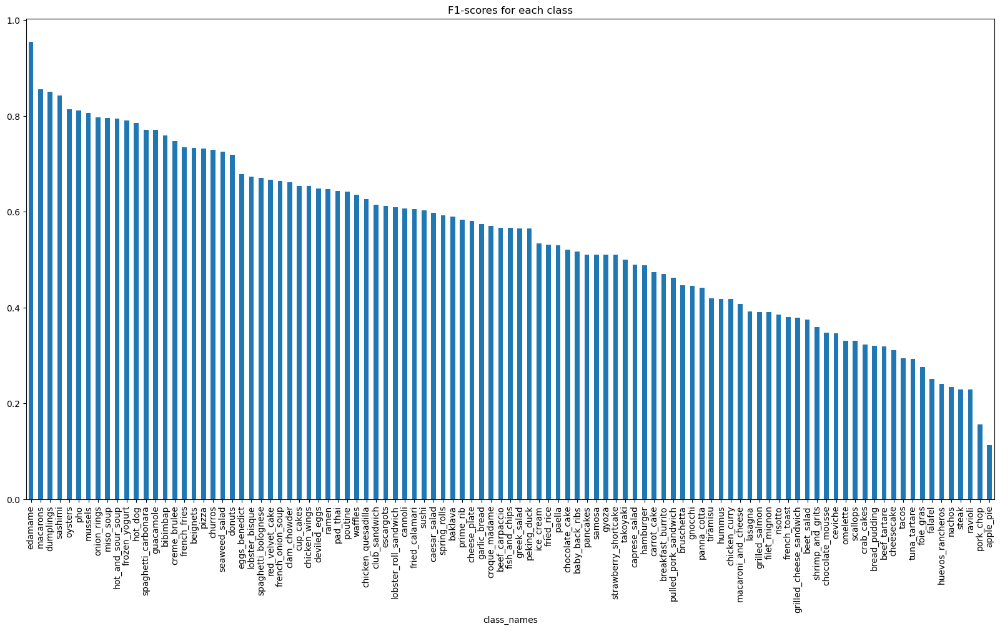

In [42]:
f1_scores.plot.bar(x="class_names", y="f1_scores", figsize=(20,10), title="F1-scores for each class", legend=False)

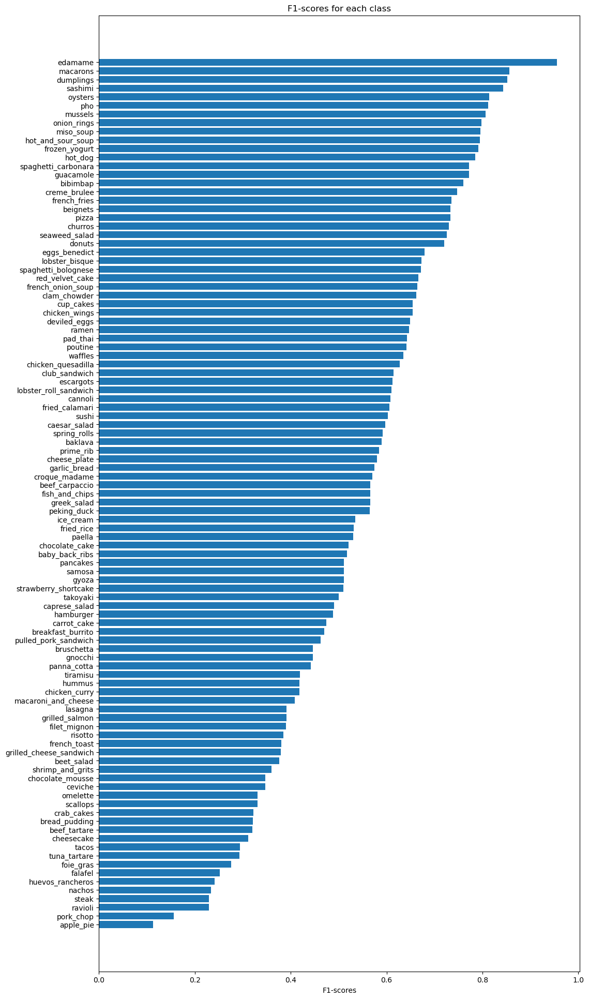

In [43]:
fig,ax = plt.subplots(figsize=(12,24))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1_scores"].values)
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(labels=f1_scores["class_names"])
ax.set_xlabel("F1-scores")
ax.set_title("F1-scores for each class")
ax.invert_yaxis()

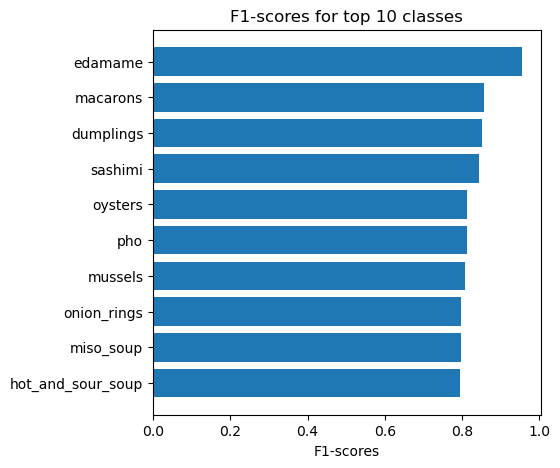

In [44]:
fig,ax = plt.subplots(figsize=(5,5))
scores = ax.barh(range(10), f1_scores["f1_scores"].values[:10])
ax.set_yticks(range(10))
ax.set_yticklabels(labels=f1_scores["class_names"][:10])
ax.set_xlabel("F1-scores")
ax.set_title("F1-scores for top 10 classes")
ax.invert_yaxis()

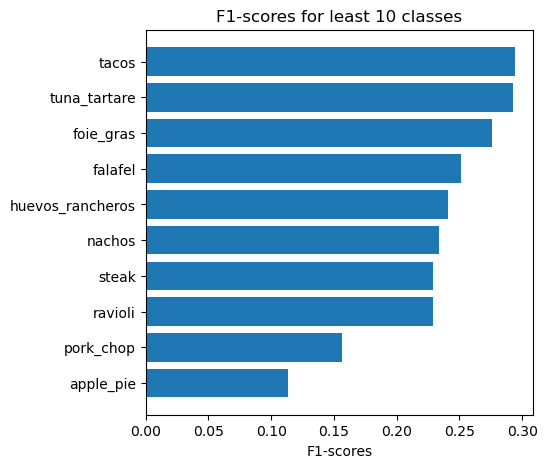

In [45]:
fig,ax = plt.subplots(figsize=(5,5))
scores = ax.barh(range(10), f1_scores["f1_scores"].values[-10:])
ax.set_yticks(range(10))
ax.set_yticklabels(labels=f1_scores["class_names"][-10:])
ax.set_xlabel("F1-scores")
ax.set_title("F1-scores for least 10 classes")
ax.invert_yaxis()

In [46]:
def load_and_prep_image(filename, img_shape=224):
    image = tf.io.read_file(filename) # read the image file
    image = tf.image.decode_image(image, channels=3) # decode the image with 3 channels rbg
    # if png convert rgba to rgb as it has 4 channels
    if image.shape[-1] == 4:
        image = tf.io.decode_image(image, channels=3)
    image = tf.image.resize(image, size=[img_shape, img_shape]) # resize the image to our desired size
    image = image/255. # Normalizing the tensor
    return image

In [47]:
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

--2023-09-10 00:39:01--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 209.85.200.207, 209.85.234.207, 142.251.172.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|209.85.200.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: ‘custom_food_images.zip’

custom_food_images. 100%[===================>]  12.58M  80.5MB/s    in 0.2s    

2023-09-10 00:39:01 (80.5 MB/s) - ‘custom_food_images.zip’ saved [13192985/13192985]



In [48]:
unzip_data("/kaggle/working/custom_food_images.zip")

In [49]:
def load_and_prep_image(filename, img_shape=224):
    image = tf.io.read_file(filename) # read the image file
    image = tf.image.decode_image(image, channels=3) # decode the image with 3 channels rbg
    # if png convert rgba to rgb as it has 4 channels
    if image.shape[-1] == 4:
        image = tf.io.decode_image(image, channels=3)
    image = tf.image.resize(image, size=[img_shape, img_shape]) # resize the image to our desired size
    image = image/255. # Normalizing the tensor
    return image

In [50]:
# function soruced from github
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  (224, 224, 3).

  Parameters
  ----------
  filename (str): string filename of target image
  img_shape (int): size to resize target image to, default 224
  scale (bool): whether to scale pixel values to range(0, 1), default True
  """
  # Read in the image
  img = tf.io.read_file(filename)
  # Decode it into a tensor
  img = tf.image.decode_jpeg(img)
  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])
  if scale:
    # Rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img

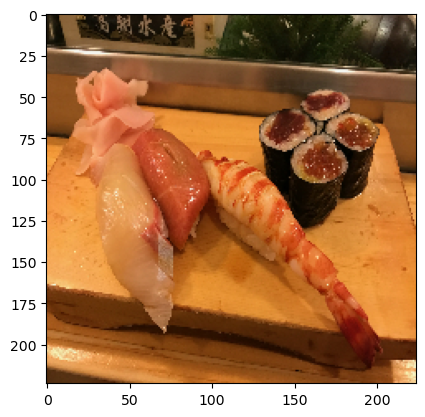

In [51]:
sushi = load_and_prep_image("/kaggle/working/custom_food_images/sushi.jpeg")
plt.imshow(sushi)

In [52]:
import random

In [53]:
def pred_and_plot(model, filename, class_names):
    img = load_and_prep_image(filename)
    pred_probs = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    plt.imshow(img)
    plt.title(f"Prediction: {pred_class}")
    plt.axis(False)

In [54]:
for i in range(3):
    class_name = random.choice(test_data.class_names)
    print(class_name)
    filename =  random.choice(os.listdir(test_dir+"/"+class_name))
    filepath = test_dir+"/"+class_name+"/"+filename
    img = load_and_prep_image(filepath)
    print(img.shape)
    pred_probs = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    print(pred_class)

miso_soup
(224, 224, 3)
1/1 [==============================] - 2s 2s/step
risotto
samosa
(224, 224, 3)
1/1 [==============================] - 0s 32ms/step
risotto
cheesecake
(224, 224, 3)
1/1 [==============================] - 0s 33ms/step
risotto


1/1 [==============================] - 0s 28ms/step


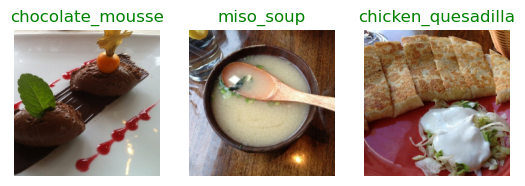

In [55]:
for i in range(3):
    class_name = random.choice(test_data.class_names)
    filename =  random.choice(os.listdir(test_dir+"/"+class_name))
    filepath = test_dir+"/"+class_name+"/"+filename
    img = load_and_prep_image(filepath, scale=False)
    pred_probs = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    plt.subplot(1,3,i+1)
    plt.imshow(img/255.) # mat
    plt.axis(False)
    if class_name == pred_class:
        title_color ="g"
    else:
        title_color = "r"
    plt.title(f"{pred_class}",c=title_color)

In [56]:
# Finding the most wrong predictions
# wrong predictions with highest prediction probability - dataset issue, confusing class - merge classes in some cases
# wrong predictions with lowest prediction probability - model issue - may be fine tune it more

In [57]:
def get_pred_and_actual_label(model, image_path, actual_label):
    """
    Takes an trained model, an image filepath and the true label and returns the prediction probabilities
    and the corresponding predicted label.
    """
    img = load_and_prep_image(image_path, scale=False)
    pred_probs = model.predict(tf.expand_dims(img, axis=0))
    pred_class = class_names[pred_probs.argmax()]
    pred_prob = pred_probs.max()
    if pred_class == actual_label:
        title_color = "g"
    else:
        title_color = "r"
    plt.imshow(img/255.)
    plt.title(f"actual: {actual_label} pred: {pred_class} prob: {pred_prob:.2f}", c=title_color)
    plt.axis(False)
    return pred_class, pred_prob

1/1 [==============================] - 0s 28ms/step


('hot_and_sour_soup', 0.96012366)

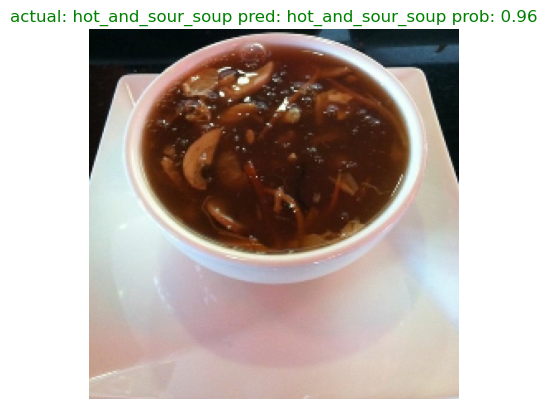

In [58]:
get_pred_and_actual_label(model,"/kaggle/input/custom/101_food_classes_10_percent/test/hot_and_sour_soup/1000486.jpg","hot_and_sour_soup")

In [59]:
filepaths = []
for filepath in test_data.list_files("/kaggle/input/custom/101_food_classes_10_percent/test/*/*.jpg", shuffle=False):
    filepaths.append(filepath.numpy())

In [60]:
pred_df = pd.DataFrame({'image_paths':filepaths,
                        'actual_labels':y_labels,
                        'pred_labels':pred_classes,
                        'pred_probs':preds_prods.max(axis=1),
                        'actual_true_classnames':[class_names[i] for i in y_labels],
                        'actual_pred_classnames':[class_names[i] for i in pred_classes]})
pred_df.head()

,image_paths,actual_labels,pred_labels,pred_probs,actual_true_classnames,actual_pred_classnames
0,b'/kaggle/input/custom/101_food_classes_10_per...,0,2,0.171187,apple_pie,baklava
1,b'/kaggle/input/custom/101_food_classes_10_per...,0,0,0.417288,apple_pie,apple_pie
2,b'/kaggle/input/custom/101_food_classes_10_per...,0,14,0.148249,apple_pie,carrot_cake
3,b'/kaggle/input/custom/101_food_classes_10_per...,0,38,0.106101,apple_pie,fish_and_chips
4,b'/kaggle/input/custom/101_food_classes_10_per...,0,8,0.138135,apple_pie,bread_pudding


In [61]:
wrong_preds = pred_df[pred_df["actual_labels"] != pred_df["pred_labels"]].sort_values("pred_probs", ascending=False)
len(wrong_preds), len(pred_df)

(11389, 25250)

In [62]:
pred_df["pred_correct"] = pred_df["actual_labels"] == pred_df["pred_labels"]

In [63]:
pred_df.head()

,image_paths,actual_labels,pred_labels,pred_probs,actual_true_classnames,actual_pred_classnames,pred_correct
0,b'/kaggle/input/custom/101_food_classes_10_per...,0,2,0.171187,apple_pie,baklava,False
1,b'/kaggle/input/custom/101_food_classes_10_per...,0,0,0.417288,apple_pie,apple_pie,True
2,b'/kaggle/input/custom/101_food_classes_10_per...,0,14,0.148249,apple_pie,carrot_cake,False
3,b'/kaggle/input/custom/101_food_classes_10_per...,0,38,0.106101,apple_pie,fish_and_chips,False
4,b'/kaggle/input/custom/101_food_classes_10_per...,0,8,0.138135,apple_pie,bread_pudding,False


In [64]:
wrong_preds[:100]

,image_paths,actual_labels,pred_labels,pred_probs,actual_true_classnames,actual_pred_classnames
17816,b'/kaggle/input/custom/101_food_classes_10_per...,71,70,0.987991,paella,pad_thai
23797,b'/kaggle/input/custom/101_food_classes_10_per...,95,86,0.986078,sushi,sashimi
23631,b'/kaggle/input/custom/101_food_classes_10_per...,94,83,0.981184,strawberry_shortcake,red_velvet_cake
23300,b'/kaggle/input/custom/101_food_classes_10_per...,93,1,0.978145,steak,baby_back_ribs
11024,b'/kaggle/input/custom/101_food_classes_10_per...,44,70,0.974854,fried_rice,pad_thai
...,...,...,...,...,...,...
6102,b'/kaggle/input/custom/101_food_classes_10_per...,24,84,0.890217,clam_chowder,risotto
17034,b'/kaggle/input/custom/101_food_classes_10_per...,68,70,0.890165,onion_rings,pad_thai
6,b'/kaggle/input/custom/101_food_classes_10_per...,0,29,0.889683,apple_pie,cup_cakes
572,b'/kaggle/input/custom/101_food_classes_10_per...,2,85,0.889232,baklava,samosa


1/1 [==============================] - 0s 27ms/step


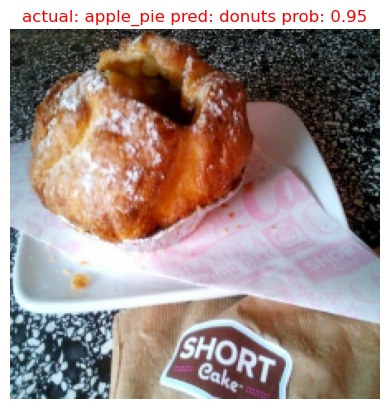

1/1 [==============================] - 0s 29ms/step


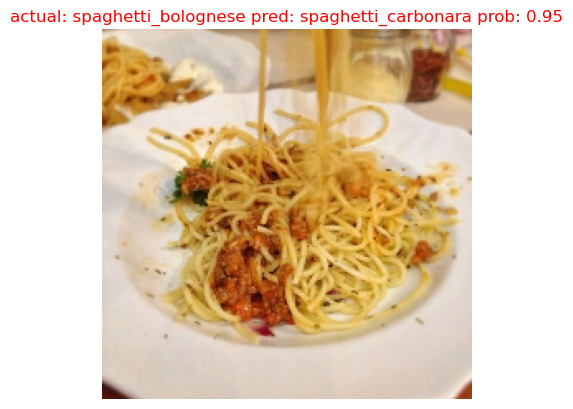

1/1 [==============================] - 0s 32ms/step


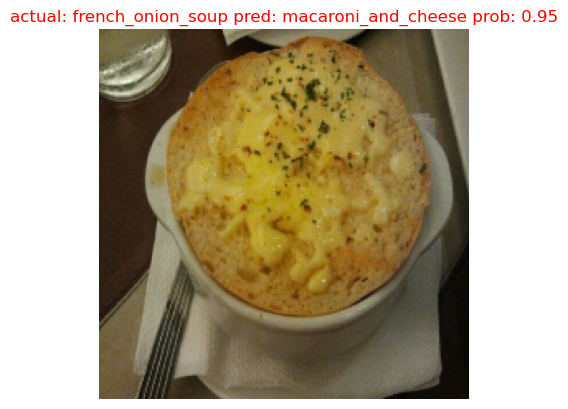

1/1 [==============================] - 0s 28ms/step


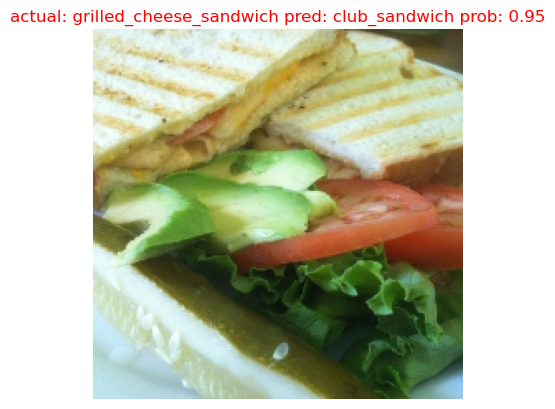

1/1 [==============================] - 0s 28ms/step


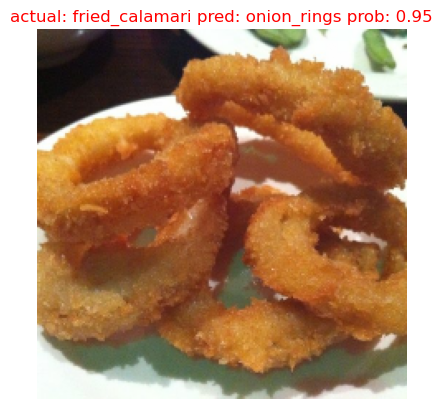

1/1 [==============================] - 0s 28ms/step


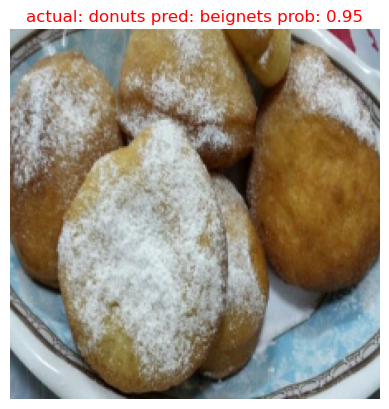

1/1 [==============================] - 0s 28ms/step


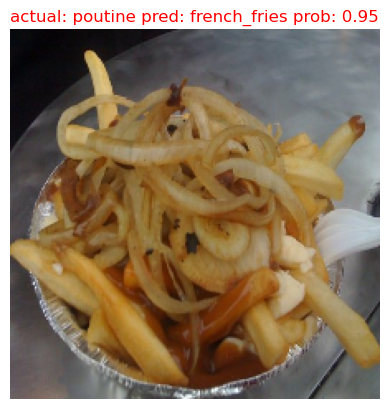

1/1 [==============================] - 0s 27ms/step


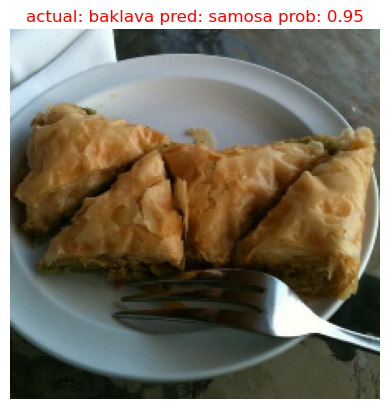

1/1 [==============================] - 0s 31ms/step


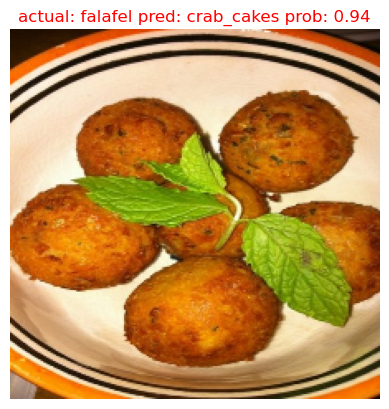

1/1 [==============================] - 0s 28ms/step


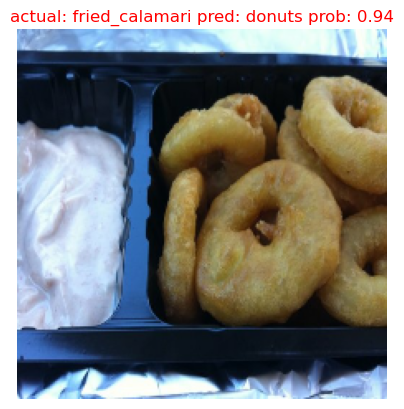

In [65]:
for i, row in wrong_preds[20:30].iterrows():
    pred_class, pred_prob = get_pred_and_actual_label(model, row["image_paths"], row["actual_true_classnames"])
    plt.show()

In [66]:
custom_food_images = ["/kaggle/working/custom_food_images/" + img_path for img_path in os.listdir("/kaggle/working/custom_food_images")]

In [67]:
custom_food_images

['/kaggle/working/custom_food_images/ramen.jpeg',
 '/kaggle/working/custom_food_images/steak.jpeg',
 '/kaggle/working/custom_food_images/pizza-dad.jpeg',
 '/kaggle/working/custom_food_images/hamburger.jpeg',
 '/kaggle/working/custom_food_images/sushi.jpeg',
 '/kaggle/working/custom_food_images/chicken_wings.jpeg']

1/1 [==============================] - 0s 33ms/step


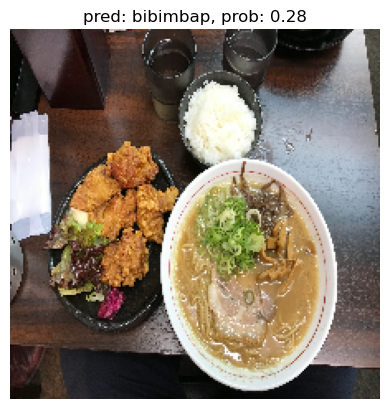

1/1 [==============================] - 0s 30ms/step


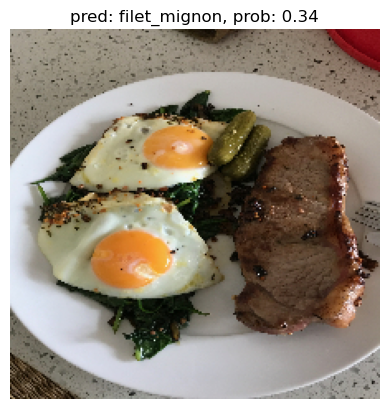

1/1 [==============================] - 0s 28ms/step


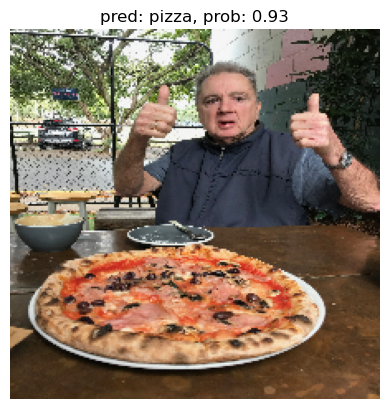

1/1 [==============================] - 0s 29ms/step


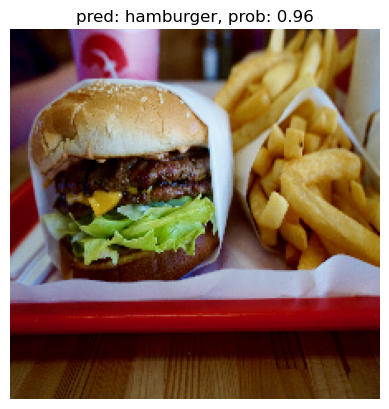

1/1 [==============================] - 0s 27ms/step


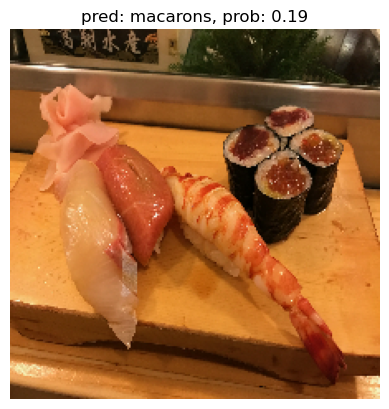

1/1 [==============================] - 0s 27ms/step


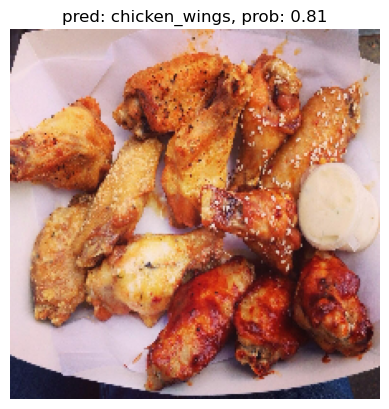

In [68]:
for image in custom_food_images:
    image = load_and_prep_image(image, scale=False)
    pred_prob = model.predict(tf.expand_dims(image, axis=0))
    pred_class = class_names[pred_prob.argmax()]
    plt.imshow(image/255.)
    plt.title(f"pred: {pred_class}, prob: {pred_prob.max():.2f}")
    plt.axis(False)
    plt.show()